In [2]:
import pandas as pd
import numpy as np
import glob
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import datetime
from matplotlib import dates as mdates
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
import statistics

In [5]:
season = ['dry-2017', 'wet-2017', 'dry-2018', 'wet-2018']
season3 = ['wet-2017','dry-2017', 'wet-2018', 'dry-2018']
season2 = ['dry-', 'wet-']
stations = ['Attapeu','Borkeo','Louangnumtha','Louangphabang','Mkham','Oudomxai','Pakse','Paksong','Paksan','Phonhong','Salavanh','Savannakhet','Sayabouli','Thakhek','Sekong','Phongsaly','Samnuea','Vientiane','Xiengkhouang']
station2 = ['Borkeo', 'Louangnumtha', 'Louangphabang', 'Oudomxai', 'Phongsaly', 'Samnuea', 'Sayabouli', 'Paksan', 'Phonhong', 'Mkham', 'Thakhek', 'Vientiane', 'Xiengkhouang','Savannakhet', 'Sekong', 'Salavanh', 'Pakse', 'Paksong', 'Attapeu']
north = ['Borkeo', 'Louangnumtha', 'Louangphabang', 'Oudomxai', 'Phongsaly', 'Samnuea', 'Sayabouli']
center = ['Paksan', 'Phonhong', 'Mkham', 'Thakhek', 'Vientiane', 'Xiengkhouang','Savannakhet']
south = ['Sekong', 'Salavanh', 'Pakse', 'Paksong', 'Attapeu']
parameters = ['para_1','para_2', 'para_3','para_4','para_5','para_6','para_7','para_8','para_9','para_10','para_11','para_12']
parameter2 = ['GsMAP','para_1','para_2', 'para_3','para_4','para_5','para_6','para_7','para_8','para_9','para_10','para_11','para_12']

# Average_Country

In [4]:
for i1 in season:
    df_list = []
    obs1 = pd.ExcelFile('../Extract_CSV/obs/DMH_DryWet_2017-2018.xlsx')
    obs2 = pd.read_excel(obs1, i1)
    gsmap1 = pd.read_csv('../Extract_CSV/GsMAP/Extracted_GsMAP/GsMAP-'+str(i1)+'.csv')
    for i2 in stations:
        wrf = []   
        for i3 in range (1,13):
            data1=pd.read_csv('../Extract_CSV/wrf-para-'+str(i3)+'/wrf-para-'+str(i3)+'-'+str(i1)+'-rainc.csv', sep=',')
            data2=pd.read_csv('../Extract_CSV/wrf-para-'+str(i3)+'/wrf-para-'+str(i3)+'-'+str(i1)+'-rainnc.csv', sep=',')

            #find instantanious rainfall
            rainc=data1['RAINNC (mm)']
            rainnc=data2['RAINNC (mm)']
            rainfall = data1['RAINNC (mm)'] + data2['RAINNC (mm)']
            utc=data1['TIME']

            #number of days
            days=int(len(utc)/19)
            #get timestamps
            timestamps=[]
            for x in range (days):
                timestamp=utc[19*x]
                timestamps.append(timestamp)
            d_text = pd.DataFrame(timestamps, columns=['date'])
            date = pd.to_datetime(d_text.date, format = '%Y-%m-%d_%H:%M:%S')
            f_date = date.dt.strftime("%d-%b-%Y")
            para = []
            para_daily = []
            for x in range (days):
                para.append(rainfall[stations.index(i2)+(x*19)])
            for y in range (len(para)):
                if y==0:
                    rainfall_daily=para[y]
                    para_daily.append(rainfall_daily)                   
                else:
                    if para[y]- para[y-1]<0:
                        rainfall_daily=para[y]
                        para_daily.append(rainfall_daily)
                    else:                     
                        rainfall_daily=(para[y]- para[y-1])
                        para_daily.append(rainfall_daily)
                        
            wrf.append(para_daily)
            df1 = pd.DataFrame(wrf)
            df2 = df1.T
        df2.columns=parameters
        obs = pd.DataFrame(obs2[i2])
        obs = obs.rename(columns={i2:'obs'})
        gsmap = pd.DataFrame(gsmap1[i2])
        gsmap = gsmap.rename(columns={i2:'GsMAP'})
        df = pd.concat([obs, gsmap,df2],axis=1)
        df_list.append(df)
        df_con = pd.concat(df_list,axis=0)
        
        df_sum=df_con.groupby(level=0).sum()
        df_mean=df_con.groupby(level=0).mean().round(3)
        rainfall_mean = pd.concat([f_date, df_mean],axis=1)
        rainfall_sum = pd.concat([f_date, df_sum],axis=1)
#         rainfall_mean.to_csv(('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv'), index=False)
#         rainfall_sum.to_csv(('../Extract_CSV/csv/Total_Rainfall in '+str(i1)+'.csv'), index=False)
        

In [206]:
for i1 in season2:
    data = []
    df_north = []
    df_center = []
    df_south = []
    for i2 in stations: 
        csv1 = pd.read_csv('../Extract_CSV/csv/Rainfall_' +str(i2)+'-'+str(i1)+'2017.csv')
        csv2 = pd.read_csv('../Extract_CSV/csv/Rainfall_' +str(i2)+'-'+str(i1)+'2018.csv')
        csv3 = csv1.append(csv2)
        csv = pd.DataFrame(csv3)
        csv.to_csv(('../Extract_CSV/csv2/Rainfall_'+str(i2)+'-'+str(i1)+'season.csv'), index=False)

# Zonation_N_C_S

In [284]:
for i1 in season2:
    df_north = []
    df_center = []
    df_south = []
    for i2 in north: 
        csv1 = pd.read_csv('../Extract_CSV/csv2/Rainfall_'+str(i2)+'-'+str(i1)+'season.csv')
        csv = pd.DataFrame(csv1)
        date1 = csv.date
        data1 = csv.drop('date',axis=1)
        df_north.append(data1)
        df_con1 = pd.concat(df_north,axis=0)
        df_mean_north=df_con1.groupby(level=0).mean().round(3)
        rainfall_mean_north = pd.concat([date1, df_mean_north],axis=1)
#         rainfall_mean_north.to_csv(('../Extract_CSV/csv2/zonation_statistic '+str(i1)+'season.csv'), index=False)
        
    for i2 in center: 
        csv1 = pd.read_csv('../Extract_CSV/csv2/Rainfall_'+str(i2)+'-'+str(i1)+'season.csv')
        csv = pd.DataFrame(csv1)
        date2 = csv.date
        data2 = csv.drop('date',axis=1)
        df_center.append(data2)
        df_con2 = pd.concat(df_center,axis=0)
        df_mean_center=df_con2.groupby(level=0).mean().round(3)
        rainfall_mean_center = pd.concat([date2, df_mean_center],axis=1)
        
    for i2 in south: 
        csv1 = pd.read_csv('../Extract_CSV/csv2/Rainfall_'+str(i2)+'-'+str(i1)+'season.csv')
        csv = pd.DataFrame(csv1)
        date3 = csv.date
        data3 = csv.drop('date',axis=1)
        df_south.append(data3)
        df_con3 = pd.concat(df_south,axis=0)
        df_mean_south=df_con3.groupby(level=0).mean().round(3)
        rainfall_mean_south = pd.concat([date3, df_mean_south],axis=1)

    
    zone = {'North':rainfall_mean_north, 'Center':rainfall_mean_center, 'South':rainfall_mean_south}
    writer = pd.ExcelWriter('../Extract_CSV/csv2/zonation_statistic '+str(i1)+'season.xlsx', engine='xlsxwriter')
    for sheet_name in zone.keys():
        zone[sheet_name].to_excel(writer, sheet_name=sheet_name, index=False)

    writer.save()
    


# Plotting

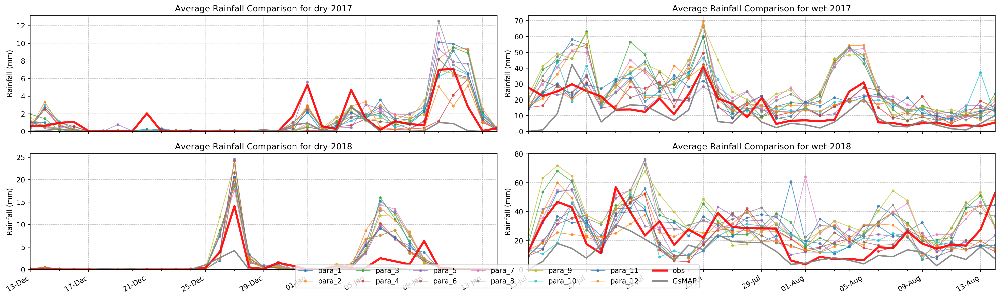

In [9]:
my_dpi=250
fig = plt.figure(figsize=(5000/my_dpi, 1500/my_dpi), dpi=my_dpi)
for i1 in season:
    csv = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols =[0,3,4,5,6,7,8,9,10,11,12,13,14])
    obs = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols =[0,1,2])

    csv1 = pd.to_datetime(csv.date, format = '%d-%b-%Y')
    csv.date = csv1
    csv2 = csv.set_index(pd.to_datetime(csv['date']))
    ax = fig.add_subplot(2,2, season.index(i1)+1)          

    num=0
    for column in csv.drop('date', axis=1):
        num+=1
        plt.plot(csv['date'], csv[column], marker='.', linewidth=1, alpha=0.7, label=column)
    ax.plot(csv2.index, obs['obs'], marker='', color='red', linewidth=3, alpha=0.9, label='obs')
    ax.plot(csv2.index, obs['GsMAP'], marker='', color='grey', linewidth=2, alpha=0.9, label='GsMAP')


    ax.set_title('Average Rainfall Comparison for '+str(i1))
    ax.set_ylabel('Rainfall (mm)')
    ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.set_ylim(0)
    start = csv2.index[0]
    end = csv2.index[-1]
    ax.set_xlim(start, end)
#     plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
    fig.autofmt_xdate()
    ax.grid(color = 'grey', linestyle = '--', linewidth=0.5, alpha=0.5)
#     extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
#     fig.savefig('../Extract_CSV/Figures/graph for Wet Season at '+str(i2)+'22.png', bbox_inches=extent)
#         plt.subplots(2,2,season.index(i1)+1)


labels_handles = {
    label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.legend(
    labels_handles.values(),
    labels_handles.keys(),
    loc= 10, ncol = 7,
    bbox_to_anchor=(0.5, 0.08),
    bbox_transform=plt.gcf().transFigure)
extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('../Extract_CSV/Figures/Average Rainfall Comparison.png')

fig.tight_layout()
plt.show()       

# KF&BMJ

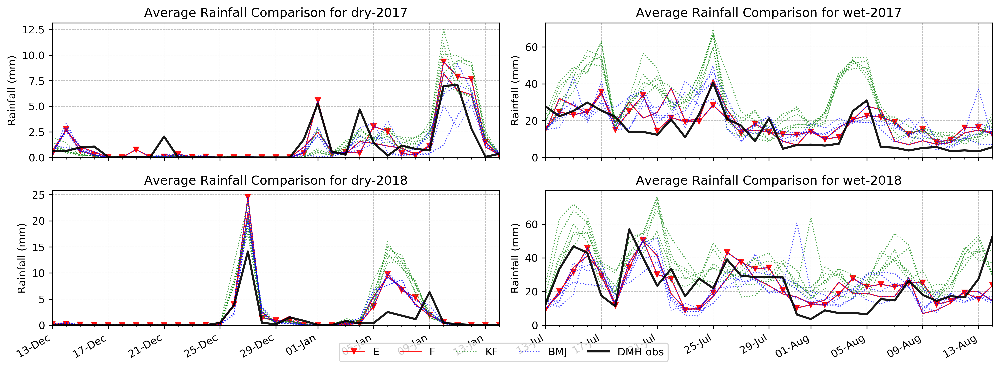

In [68]:
my_dpi=300
fig = plt.figure(figsize=(4000/my_dpi, 1500/my_dpi), dpi=my_dpi)
for i1 in season:
    dd = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv')
    kf = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,3,4,5,9,10,11])
    bmj = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,6,7,8,12,13,14])
    obs = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols =[0,1,2])

    csv1 = pd.to_datetime(kf.date, format = '%d-%b-%Y')
    kf.date = csv1
    csv2 = kf.set_index(pd.to_datetime(kf['date']))

    ax = fig.add_subplot(2,2,season.index(i1)+1)
    ax.plot(csv2.index, dd['para_5'], marker='v', markersize = 5, color='red', linewidth=1, alpha=0.9, label='E')
    ax.plot(csv2.index, dd['para_6'], marker='', color='red', linewidth=1, alpha=0.9, label='F')
    a = 0
    for column in kf.drop('date', axis=1):
        a+=1
        ax.plot(csv2.index, kf[column], linestyle= 'dotted', color = 'green' ,alpha=0.7,  linewidth=1, label= 'KF')
    b = 0
    for column in bmj.drop('date', axis=1):
        b+=1
        ax.plot(csv2.index, bmj[column], linestyle= 'dotted', color = 'blue' ,alpha=0.7,  linewidth=1, label= 'BMJ')
    ax.plot(csv2.index, obs['obs'], marker='', color='black', linewidth=2, alpha=0.9, label='DMH obs')

    ax.set_title('Average Rainfall Comparison for '+str(i1))
    ax.set_ylabel('Rainfall (mm)')
    ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.set_ylim(0)
    start = csv2.index[0]
    end = csv2.index[-1]
    ax.set_xlim(start, end)
#     plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
    fig.autofmt_xdate()
    ax.grid(color = 'grey', linestyle = '--', linewidth=0.5, alpha=0.5)



labels_handles = {
    label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.legend(
    labels_handles.values(),
    labels_handles.keys(),
    loc= 10, ncol = 7,
    bbox_to_anchor=(0.5, 0.05),
    bbox_transform=plt.gcf().transFigure)
extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('../Extract_CSV/Figures/Average Rainfall Comparison for all parameters_KF&BMJ.png')

fig.tight_layout()
plt.show()       

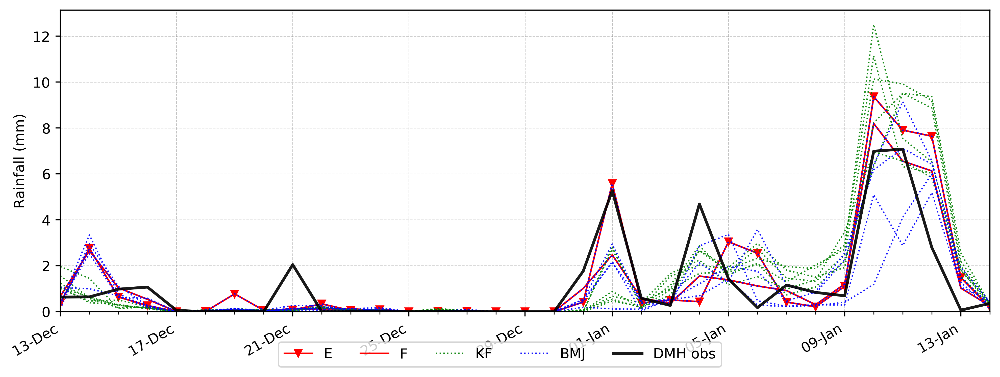

In [60]:
my_dpi=400
fig = plt.figure(figsize=(4000/my_dpi, 1500/my_dpi), dpi=my_dpi)
i1 = 'dry-2017'
dd = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv')
kf = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,3,4,5,9,10,11])
bmj = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,6,7,8,12,13,14])
obs = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols =[0,1,2])

csv1 = pd.to_datetime(kf.date, format = '%d-%b-%Y')
kf.date = csv1
csv2 = kf.set_index(pd.to_datetime(kf['date']))

#     ax = fig.add_subplot(2,2,season.index(i1)+1)
ax = fig.add_subplot(111)
ax.plot(csv2.index, dd['para_5'], marker='v', markersize = 5, color='red', linewidth=1.2, alpha=1, label='E')
ax.plot(csv2.index, dd['para_6'], marker='', color='red', linewidth=1.2, alpha=1, label='F')
a = 0
for column in kf.drop('date', axis=1):
    a+=1
    ax.plot(csv2.index, kf[column], linestyle= 'dotted', color = 'green' ,alpha=0.9,  linewidth=1, label= 'KF')
b = 0
for column in bmj.drop('date', axis=1):
    b+=1
    ax.plot(csv2.index, bmj[column], linestyle= 'dotted', color = 'blue' ,alpha=0.9,  linewidth=1, label= 'BMJ')
ax.plot(csv2.index, obs['obs'], marker='', color='black', linewidth=2, alpha=0.9, label='DMH obs')

#     ax.set_title('Average Rainfall Comparison for '+str(i1))
ax.set_ylabel('Rainfall (mm)')
ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
ax.set_ylim(0)
start = csv2.index[0]
end = csv2.index[-1]
ax.set_xlim(start, end)
#     plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
fig.autofmt_xdate()
ax.grid(color = 'grey', linestyle = '--', linewidth=0.5, alpha=0.5)

labels_handles = {
    label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.legend(
    labels_handles.values(),
    labels_handles.keys(),
    loc= 10, ncol = 7,
    bbox_to_anchor=(0.5, 0.05),
    bbox_transform=plt.gcf().transFigure)
extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('../Extract_CSV/Figures/KF&BMJ '+str(i1)+ '.png')

fig.tight_layout()
plt.show()       

# PBL

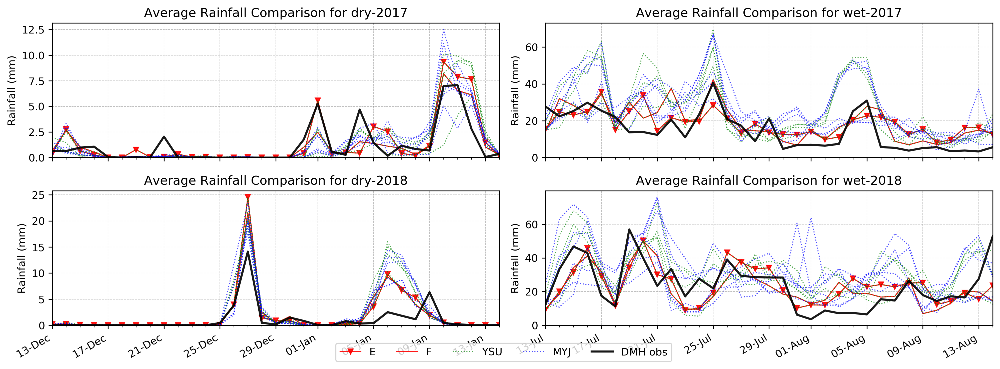

In [67]:
my_dpi=300
fig = plt.figure(figsize=(4000/my_dpi, 1500/my_dpi), dpi=my_dpi)
for i1 in season:
    dd = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv')
    ysu = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,3,4,5,6,7,8])
    myj = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,9,10,11,12,13,14])
    obs = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols =[0,1,2])

    csv1 = pd.to_datetime(ysu.date, format = '%d-%b-%Y')
    ysu.date = csv1
    csv2 = ysu.set_index(pd.to_datetime(ysu['date']))

    ax = fig.add_subplot(2,2,season.index(i1)+1)
    ax.plot(csv2.index, dd['para_5'], marker='v', markersize = 5, color='red', linewidth=1, alpha=0.9, label='E')
    ax.plot(csv2.index, dd['para_6'], marker='', color='red', linewidth=1, alpha=0.9, label='F')
    a = 0
    for column in ysu.drop('date', axis=1):
        a+=1
        ax.plot(csv2.index, ysu[column], linestyle= 'dotted', color = 'green' ,alpha=0.7,  linewidth=1, label= 'YSU')
    b = 0
    for column in myj.drop('date', axis=1):
        b+=1
        ax.plot(csv2.index, myj[column], linestyle= 'dotted', color = 'blue' ,alpha=0.7,  linewidth=1, label= 'MYJ')
    ax.plot(csv2.index, obs['obs'], marker='', color='black', linewidth=2, alpha=0.9, label='DMH obs')

    ax.set_title('Average Rainfall Comparison for '+str(i1))
    ax.set_ylabel('Rainfall (mm)')
    ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.set_ylim(0)
    start = csv2.index[0]
    end = csv2.index[-1]
    ax.set_xlim(start, end)
#     plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
    fig.autofmt_xdate()
    ax.grid(color = 'grey', linestyle = '--', linewidth=0.5, alpha=0.5)



labels_handles = {
    label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.legend(
    labels_handles.values(),
    labels_handles.keys(),
    loc= 10, ncol = 7,
    bbox_to_anchor=(0.5, 0.05),
    bbox_transform=plt.gcf().transFigure)
extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('../Extract_CSV/Figures/Average Rainfall Comparison for all parameters_PBL.png')

fig.tight_layout()
plt.show()       

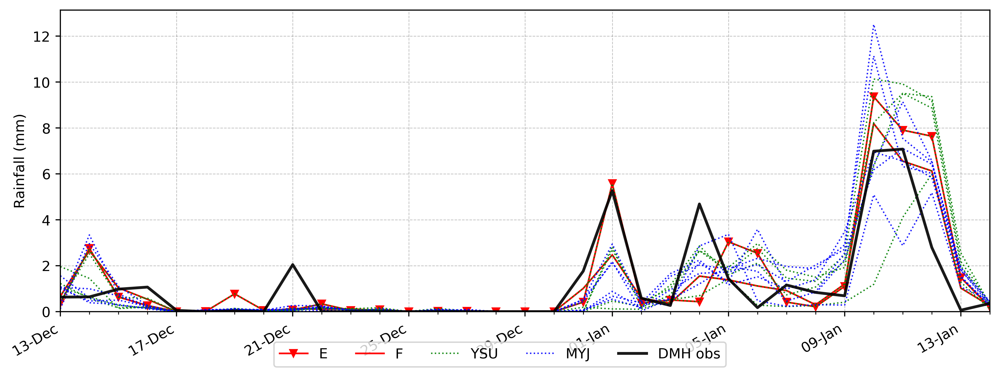

In [64]:
my_dpi=400
fig = plt.figure(figsize=(4000/my_dpi, 1500/my_dpi), dpi=my_dpi)
i1 = 'dry-2017'
dd = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv')
ysu = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,3,4,5,6,7,8])
myj = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols = [0,9,10,11,12,13,14])
obs = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols =[0,1,2])

csv1 = pd.to_datetime(ysu.date, format = '%d-%b-%Y')
ysu.date = csv1
csv2 = ysu.set_index(pd.to_datetime(ysu['date']))

ax = fig.add_subplot(111)
ax.plot(csv2.index, dd['para_5'], marker='v', markersize = 5, color='red', linewidth=1.2, alpha=1, label='E')
ax.plot(csv2.index, dd['para_6'], marker='', color='red', linewidth=1.2, alpha=1, label='F')
a = 0
for column in ysu.drop('date', axis=1):
    a+=1
    ax.plot(csv2.index, ysu[column], linestyle= 'dotted', color = 'green' ,alpha=0.9,  linewidth=1, label= 'YSU')
b = 0
for column in myj.drop('date', axis=1):
    b+=1
    ax.plot(csv2.index, myj[column], linestyle= 'dotted', color = 'blue' ,alpha=0.9,  linewidth=1, label= 'MYJ')
ax.plot(csv2.index, obs['obs'], marker='', color='black', linewidth=2, alpha=0.9, label='DMH obs')

#     ax.set_title('Average Rainfall Comparison for '+str(i1))
ax.set_ylabel('Rainfall (mm)')
ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
ax.set_ylim(0)
start = csv2.index[0]
end = csv2.index[-1]
ax.set_xlim(start, end)
#     plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
fig.autofmt_xdate()
ax.grid(color = 'grey', linestyle = '--', linewidth=0.5, alpha=0.5)



labels_handles = {
    label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.legend(
    labels_handles.values(),
    labels_handles.keys(),
    loc= 10, ncol = 7,
    bbox_to_anchor=(0.5, 0.05),
    bbox_transform=plt.gcf().transFigure)
extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('../Extract_CSV/Figures/PBL for '+ str(i1)+ '.png')

fig.tight_layout()
plt.show()       

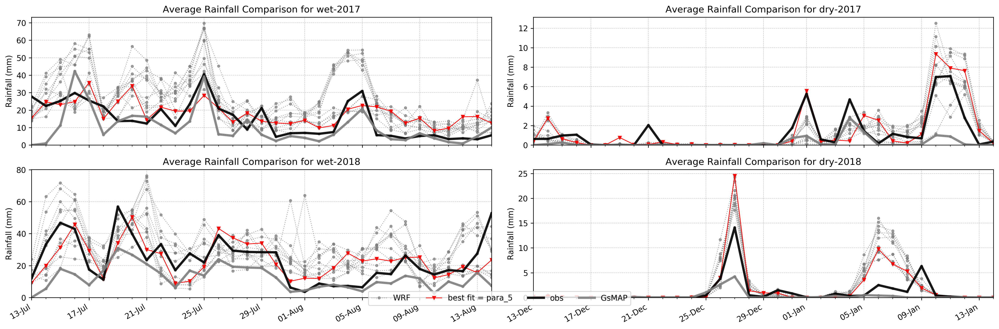

In [82]:
my_dpi=250
fig = plt.figure(figsize=(4500/my_dpi, 1500/my_dpi), dpi=my_dpi)
for i1 in season3:
    csv = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv')
    obs = pd.read_csv('../Extract_CSV/csv/Average_Rainfall in '+str(i1)+'.csv', usecols =[0,1,2])

    csv1 = pd.to_datetime(csv.date, format = '%d-%b-%Y')
    csv.date = csv1
    csv2 = csv.set_index(pd.to_datetime(csv['date']))
    ax = fig.add_subplot(2,2, season3.index(i1)+1)          
    
    num=0
    for column in csv.drop('date', axis=1):
        num+=1
        plt.plot(csv['date'], csv[column], marker='.', linestyle= 'dotted', color = 'grey', linewidth=1, alpha=0.7, label= 'WRF')
    ax.plot(csv2.index, csv['para_5'], marker='v', markersize=4, color = 'red',alpha=0.9,  linewidth=1, label='best fit = para_5')
    ax.plot(csv2.index, obs['obs'], marker='', color='black', linewidth=3, alpha=0.9, label='obs')
    ax.plot(csv2.index, obs['GsMAP'], marker='', color='grey', linewidth=3, alpha=0.9, label='GsMAP')


    ax.set_title('Average Rainfall Comparison for '+str(i1))
    ax.set_ylabel('Rainfall (mm)')
    ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.set_ylim(0)
    start = csv2.index[0]
    end = csv2.index[-1]
    ax.set_xlim(start, end)

    fig.autofmt_xdate()
    ax.grid(color = 'grey', linestyle = '--', linewidth=0.5, alpha=0.5)


labels_handles = {
    label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.legend(
    labels_handles.values(),
    labels_handles.keys(),
    loc= 10, ncol = 5,
    bbox_to_anchor=(0.5, 0.1),
    bbox_transform=plt.gcf().transFigure)
extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
fig.savefig('../Extract_CSV/Figures/publications/wet and dry.png', bbox_inches=extent)

fig.tight_layout()
plt.show()       

# Task_61

## Observation data

In [6]:
import os
import glob
file_path = '../Extract_CSV/obs/Obs_processing'
var = ['Pcp(mm)', 'Tmax(c)', 'Tmin(c)', 'WSpeed(m/s)', 'RHumidity(fr)', 'SRad(MJ/m2)', 'SShine(hr)', 'Cloud(1/10)', 'Tavg(c)']

writer =  pd.ExcelWriter('../Extract_CSV/obs/DMH_obs_all_stations.xlsx', engine='xlsxwriter')
for i1 in stations:  
    read_files = glob.glob(os.path.join(file_path,str(i1)+"*.csv"))
    print(read_files)
    
# #     print(read_files)
    
    for files in read_files:
        df = pd.read_csv(files)
#         num_missing = (df[var] == -99).sum()
#         # report the results
#         print(read_files)
#         print(num_missing)

        f_date = pd.to_datetime(df.Year*10000+df.Mon*100+df.Day,format='%Y%m%d')
        date = f_date.dt.strftime("%d-%b-%Y")
        pr = df['Pcp(mm)']
        sheet1 = pd.concat([date, df['Pcp(mm)'], df['Tmax(c)'], df['Tmin(c)']], axis =1)
        df2 = pd.DataFrame(sheet1)
        df2.rename(columns={0:'Date','Pcp(mm)':'Prec(mm)'},inplace=True)
        df2.to_excel(writer, sheet_name= str(i1), index=False)
writer.save()

['../Extract_CSV/obs/Obs_processing\\Attapeu_101_1992-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Borkeo_102_1996-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Louangnumtha_103_1994-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Louangphabang_104_1972-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\MKham_204_1999-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Oudomxai_105_1991-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Pakse_107_1971-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Paksong_211_2002-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Paksan_106_1965-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Phonhong_109_1971-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Salavanh_110_1990-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Savannakhet_111_1971-01-01_2019-12-31.csv']
['../Extract_CSV/obs/Obs_processing\\Sayabouli_112_1971-01-01_20

In [101]:
import os
import glob
file_path = '../Extract_CSV/obs/Obs_processing'
var = ['Pcp(mm)', 'Tmax(c)', 'Tmin(c)', 'WSpeed(m/s)', 'RHumidity(fr)', 'SRad(MJ/m2)', 'SShine(hr)', 'Cloud(1/10)', 'Tavg(c)']

for i1 in stations:  
    read_files = glob.glob(os.path.join(file_path,str(i1)+"*.csv"))
    
# #     print(read_files)
    
    for files in read_files:
        df = pd.read_csv(files)

        f_date = pd.to_datetime(df.Year*10000+df.Mon*100+df.Day,format='%Y%m%d')
        date = f_date.dt.strftime("%d-%b-%Y")
        pr = df['Pcp(mm)']
        sheet1 = pd.concat([date, df['Pcp(mm)'], df['Tmax(c)'], df['Tmin(c)']], axis =1)
        df2 = pd.DataFrame(sheet1)
        df2.rename(columns={0:'Date'},inplace=True)
        df2.to_csv(('../Extract_CSV/obs/Obs_data_rev/obs@'+str(i1)+'.csv'), index=False)

In [174]:
startdate = '2016-10-01'
enddate = '2017-09-30'
obs_dmh = []
for i1 in station2:    
    obs = pd.read_csv('../Extract_CSV/obs/Obs_data_rev/obs@'+str(i1)+'.csv',
                     parse_dates = ['Date'],
                     index_col = ['Date'])
    obs_time = obs['Pcp(mm)'].loc[startdate:enddate]
    obs_dmh.append(obs_time)
    df1 = pd.DataFrame(obs_dmh)
    df2 = df1.T
df2.columns = station2
df2.to_csv('../Extract_CSV/obs/Obs_data_rev/dmh_obs_2016-17.csv')

## Plotting 

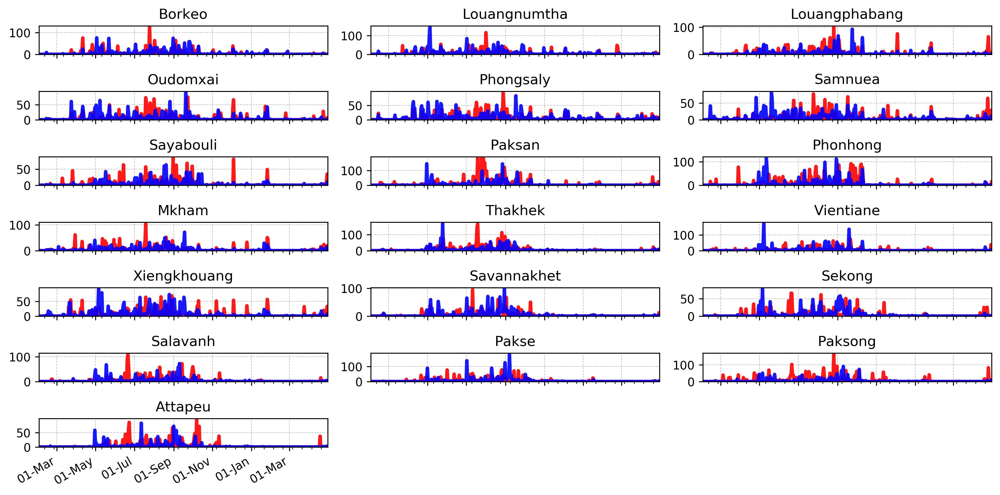

In [160]:
startdate = '2015-02-01'
enddate = '2016-04-30'
my_dpi=250
fig = plt.figure(figsize=(3000/my_dpi, 1500/my_dpi), dpi=my_dpi)
for i1 in station2:    
    obs = pd.read_csv('../Extract_CSV/obs/Obs_data_rev/obs@'+str(i1)+'.csv',
                     parse_dates = ['Date'],
                     index_col = ['Date'])
    wrf = pd.read_csv('../Extract_CSV/task_61/output_1.csv',
                      parse_dates = ['Date'],
                      index_col = ['Date'])
    obs_time = obs['Pcp(mm)'].loc[startdate:enddate]
    wrf_time = wrf[str(i1)].loc[startdate:enddate]
    
    ax = fig.add_subplot(7,3, station2.index(i1)+1)
    ax.plot(obs_time.index, obs_time, marker='', color='red', linewidth=3, alpha=0.9)
    ax.plot(wrf_time.index, wrf_time, marker='', color='blue', linewidth=3, alpha=0.9)   
    
    ax.set_title(str(i1))
#     ax.set_ylabel('Rainfall (mm)')
    ax.xaxis.set_minor_locator(mdates.DayLocator(interval=15))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.set_ylim(0)
    start = obs_time.index[0]
    end = obs_time.index[-1]
    ax.set_xlim(start, end)
#     plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=5))
    fig.autofmt_xdate()
    ax.grid(color = 'grey', linestyle = '--', linewidth=0.5, alpha=0.5)
#     extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
#     fig.savefig('../Extract_CSV/Figures/graph for Wet Season at '+str(i2)+'22.png', bbox_inches=extent)
#         plt.subplots(2,2,season.index(i1)+1)


#     labels_handles = {
#     label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
#     fig.legend(
#         labels_handles.values(),
#         labels_handles.keys(),
#         loc= 'upper right', ncol = 7,
#         bbox_to_anchor=(0.5, 0.08),
#         bbox_transform=plt.gcf().transFigure)
#     extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    # fig.savefig('../Extract_CSV/Figures/Average Rainfall Comparison.png')

fig.tight_layout()
plt.show()       